In [2]:
import os
import rR_Analyser_refactored as rRA

folder = "/l/i/Catalight/rR/emission_files"
os.chdir(folder)

files = {file: 
         rRA.read_file_unicolumn("", file, mode="emission")
         for file in os.listdir() if file.startswith("1_")}
#t = t.spectra().norm_peak(650, 5).to_table()
files.keys()

dict_keys(['1_cf3.txt', '1_prbim.txt', '1_tbu.txt'])

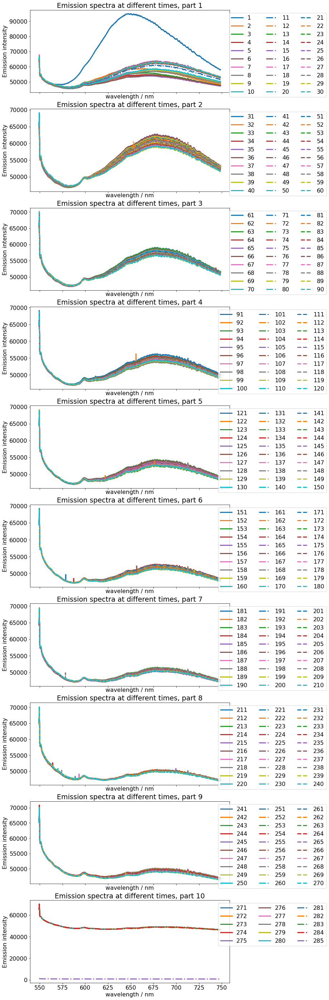

In [3]:
files["1_cf3.txt"].spectra().plot()

In [13]:
import numpy as np
t = files["1_cf3.txt"]
time_dimension = len(t.spectrum_numbers)
wave_dimension = len(t.wavenumbers)

A = t.df.to_numpy().transpose()        # dim: (1340, 285) -> (285, 1340)
#CInit = np.zeros((time_dimension, 3))  # dim: (258, 3)
ST0 = np.array([t.spectrum(1).ydata, t.spectrum(2).ydata])  # dim: (3, 1340)
from pymcr.mcr import McrAR
mcrar = McrAR()
mcrar.fit(A, ST=ST0)
mcrar.ST_

array([[103658.95417944, 105544.32224459,  92954.31996378, ...,
        107823.48768246, 107871.93738139, 107882.42898133],
       [ 43197.19053901,  46013.7598032 ,  46604.97205703, ...,
         30930.4462573 ,  30939.84488067,  30984.06005058]])

In [16]:
len(mcrar.ST_)

2

In [15]:
solns = rRA.Spectra()

for i in range(len(mcrar.ST_)):
    solns["Component " + str(i)] = rRA.Spectrum(t.wavenumbers,mcrar.ST_[i],mode="emission")

solns.plot()

solns = rRA.Timeplots()

for i in range(len(mcrar.C_)):
    solns["Component " + str(i)] = rRA.Timeplot(t.spectrum_numbers,mcrar.C_.transpose()[i])
    
solns.plot()

IndexError: index 2 is out of bounds for axis 0 with size 2

In [5]:
c = t.timeplot(t.find_nearest_wavenumber(650)).ydata
CInit = np.array([c, c, c]).transpose()
mcrar.fit(A, C=CInit)

In [6]:
t.mcr()

In [ ]:
t.spectrum(1).plot()

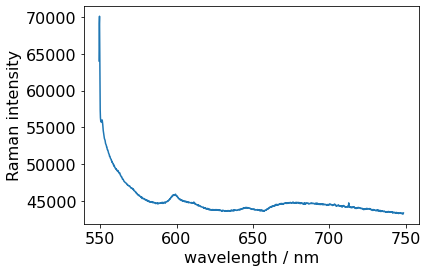

In [25]:
solvent = A.read_file_simple("", "TEA_ACN_473nm_600_1s60x_blue-LEDs.txt",
                             mode="emission")
solvent.plot()

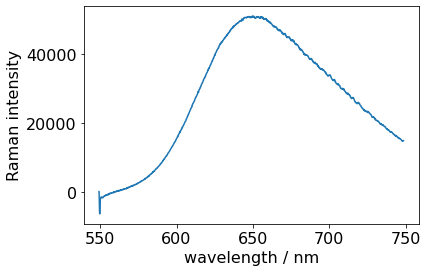

In [26]:
t.spectrum(1).subtract(solvent).plot()

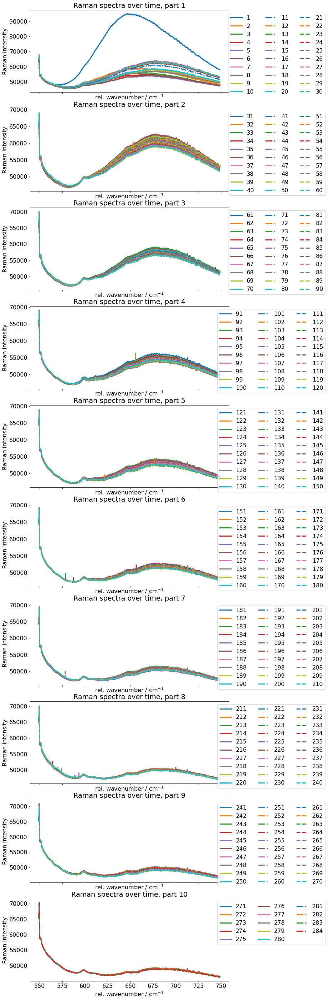

In [9]:
t.spectra().plot(savepath="CF3_TEA_ACN_473nm_600_1s60x_5hours_blue-LEDs.png")

In [31]:
t.find_nearest_wavenumber(650)

650.074

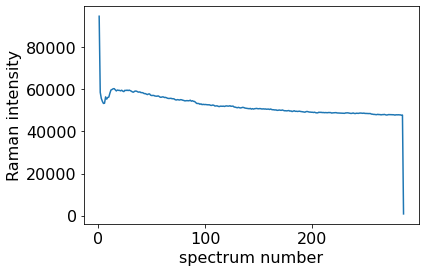

In [32]:
t.timeplot(650.074).plot()

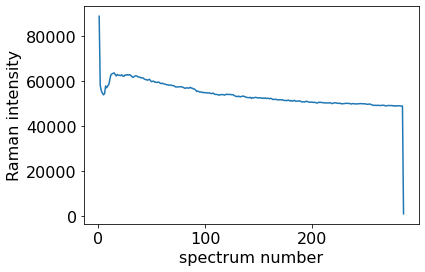

In [33]:
t.timeplot(675.001).crop(0,290).plot()

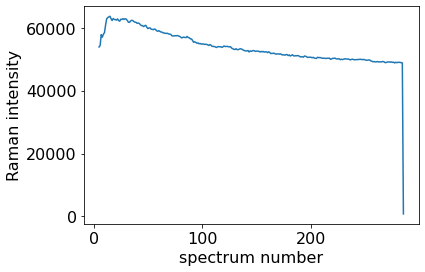

In [34]:
t.timeplot(675.001).crop(5,314).plot()